In [1]:
!pip install igraph

In [1]:
import requests
import networkx
import time
import collections
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import scipy as sp
import seaborn as sns
import scipy.spatial as spt
import igraph
# from main import *
# from vk_token import *
from functions_for_vk_users import *
from functions_for_vk_groups import *

In [2]:
%matplotlib inline

In [3]:
sns.set(style="whitegrid", color_codes=True)

## 1. Friends network summary

### 1.1. Network source and preprocessing

Source of my network is **VK** you can see full realization of getting this graph from vk in **data_mining_labs_graph.ipynb** + **function_for_vk_groups.py**

In [4]:
# g = nx.read_gml('dml.gml')
g = nx.read_gpickle('myGraph.gpickle')

### 1.2. Node degree graph

In [5]:
# g = drop_users(g)

In [6]:
node_degree = nx.degree(g)

In [7]:
node_degree = [v for k, v in g.degree]

In [8]:
np.mean(node_degree)

5.904109589041096

In [9]:
get_basic_information(g)

'Friends' network has 146 active members with 431 connections between each other.
Number of connected components = 25


In [10]:
core_g = drop_lonely_users(g, 5)

In [11]:
get_basic_information(core_g)

'Friends' network has 71 active members with 310 connections between each other.
Number of connected components = 4


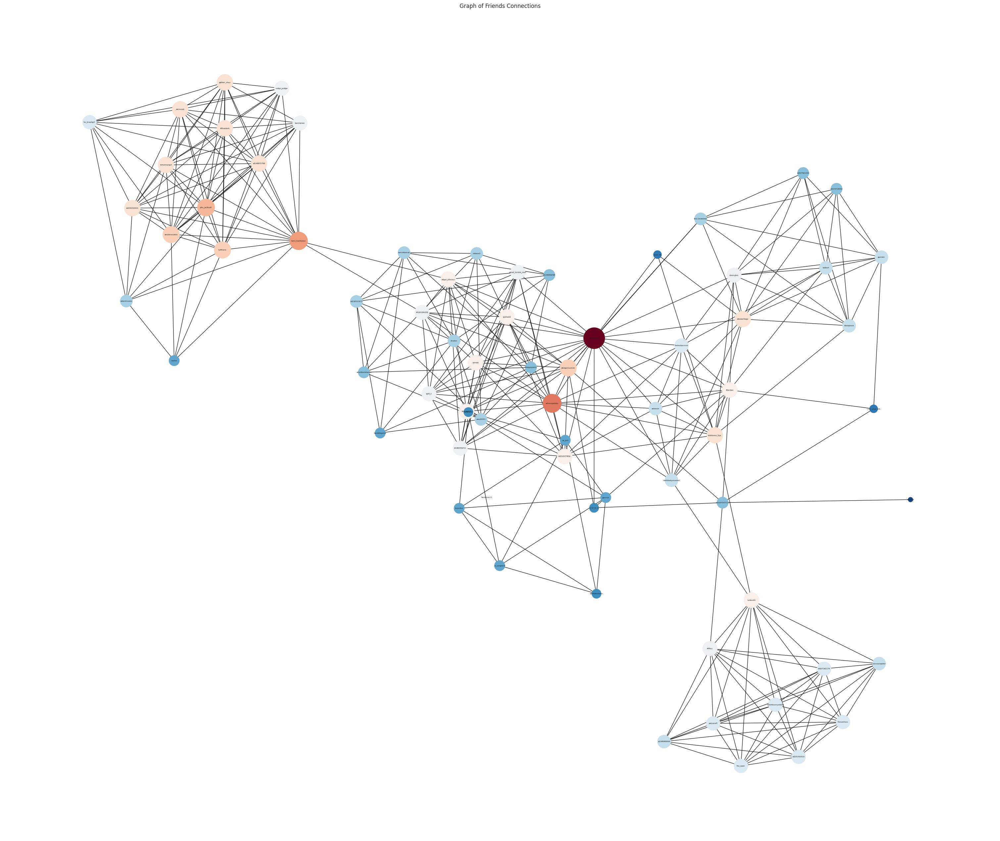

In [12]:
show_graph(core_g, core_g.degree(), 100)

### 1.3. Degree distribution 

In [13]:
# g = nx.read_gml('dml.gml')
g = nx.read_gpickle('myGraph.gpickle')

In [14]:
node_degree = get_nodes_degree(g)

Max value of node degree = 21
Mean value of node degree = 5.904109589041096


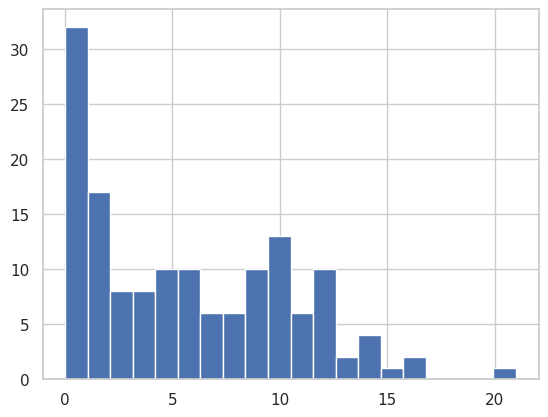

In [15]:
degree_sequence = sorted(node_degree, reverse=True)
plt.hist(degree_sequence, bins = 20, facecolor='b')
plt.show()

In [16]:
print(len([n for n in node_degree if node_degree[n] == 0]), 'people with no intersected friends')

22 people with no intersected friends


### 1.4. Diameter

In [17]:
g = drop_lonely_users(g, 0)

In [18]:
conn_g = nx.connected_components(g)

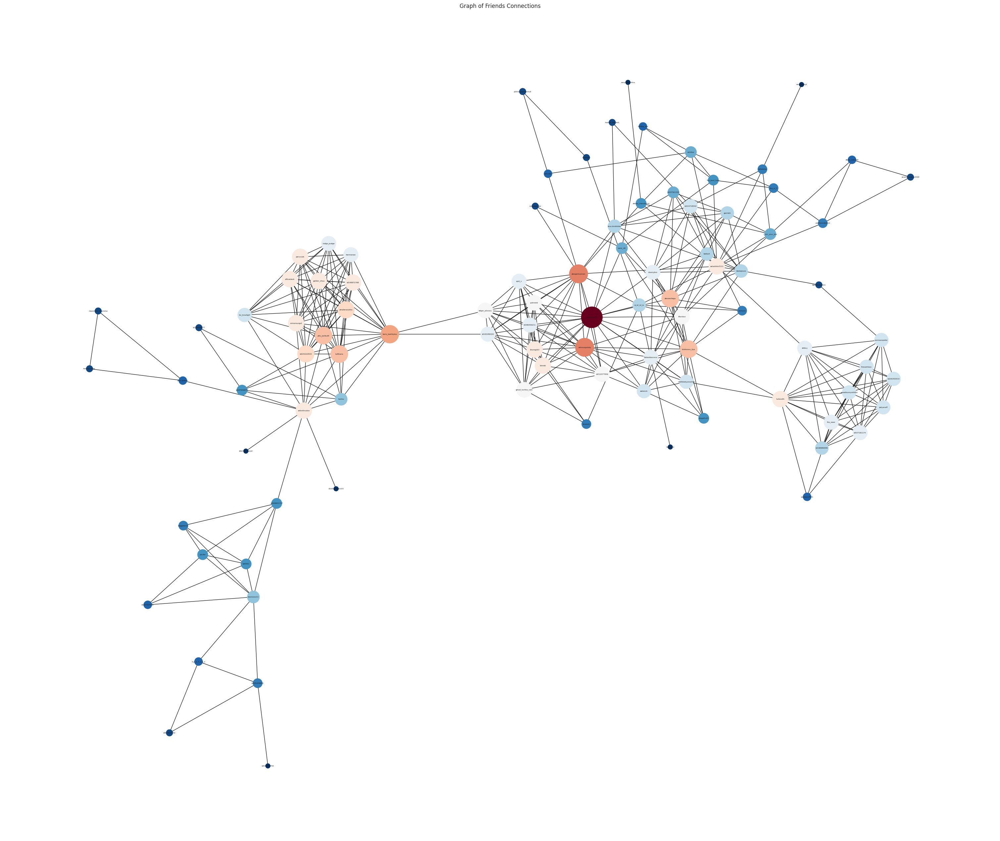

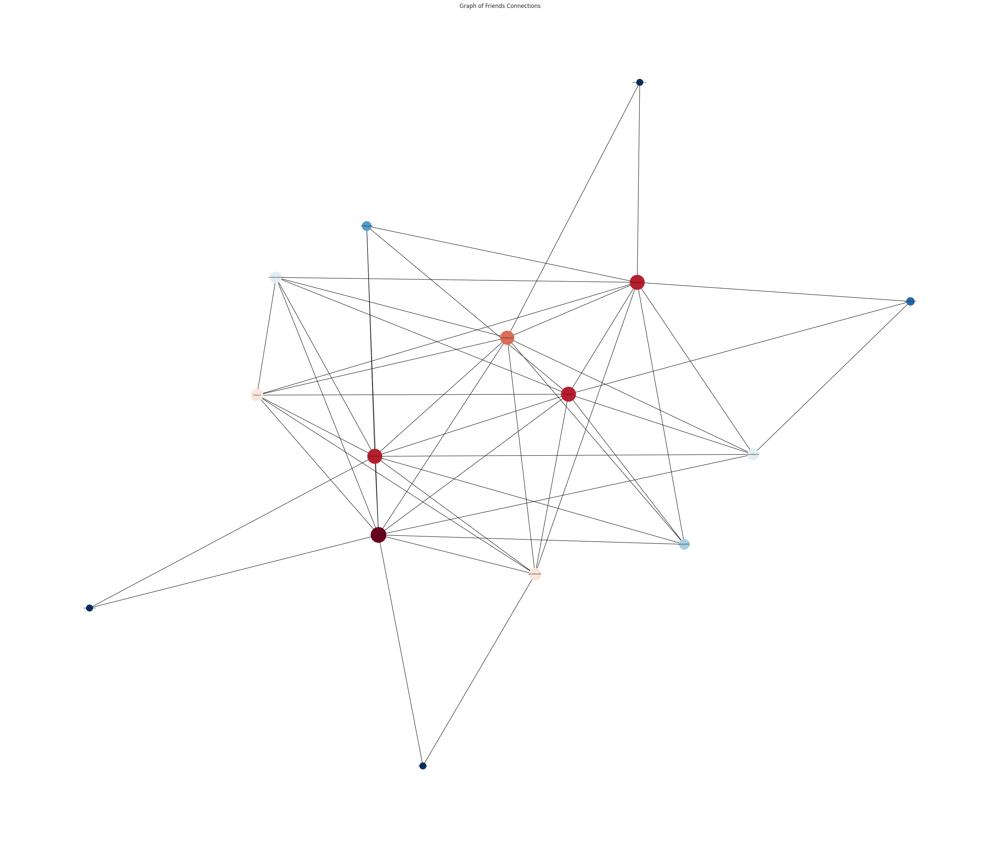

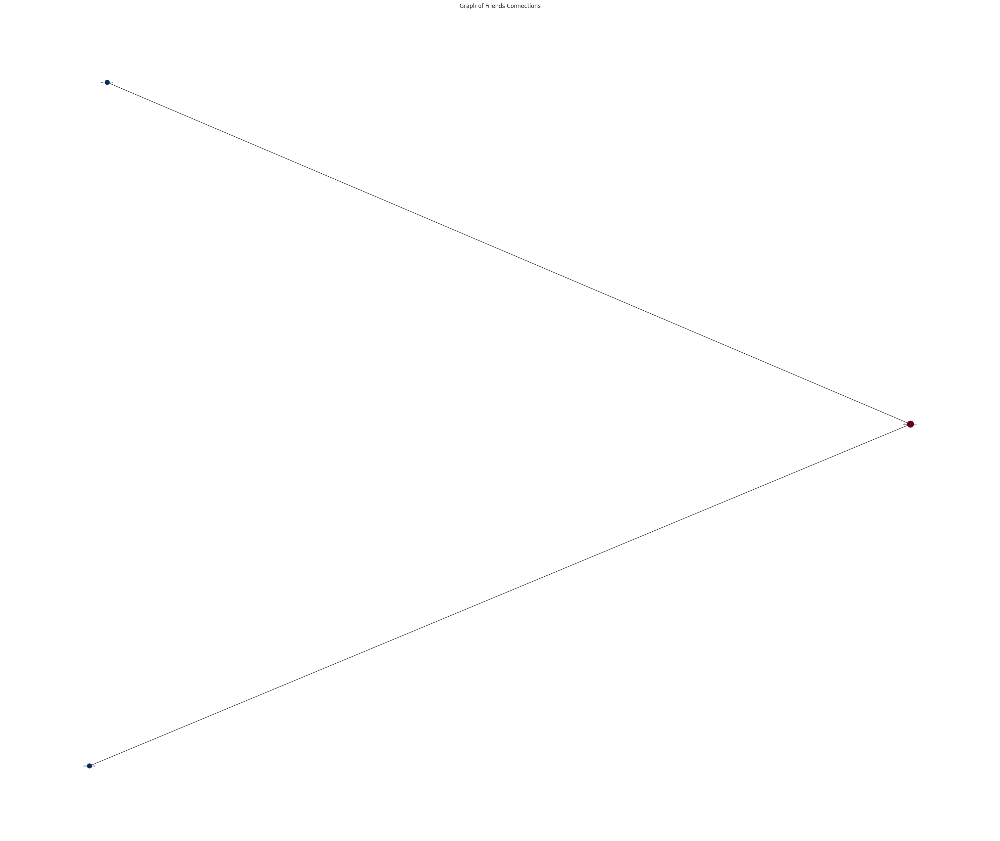

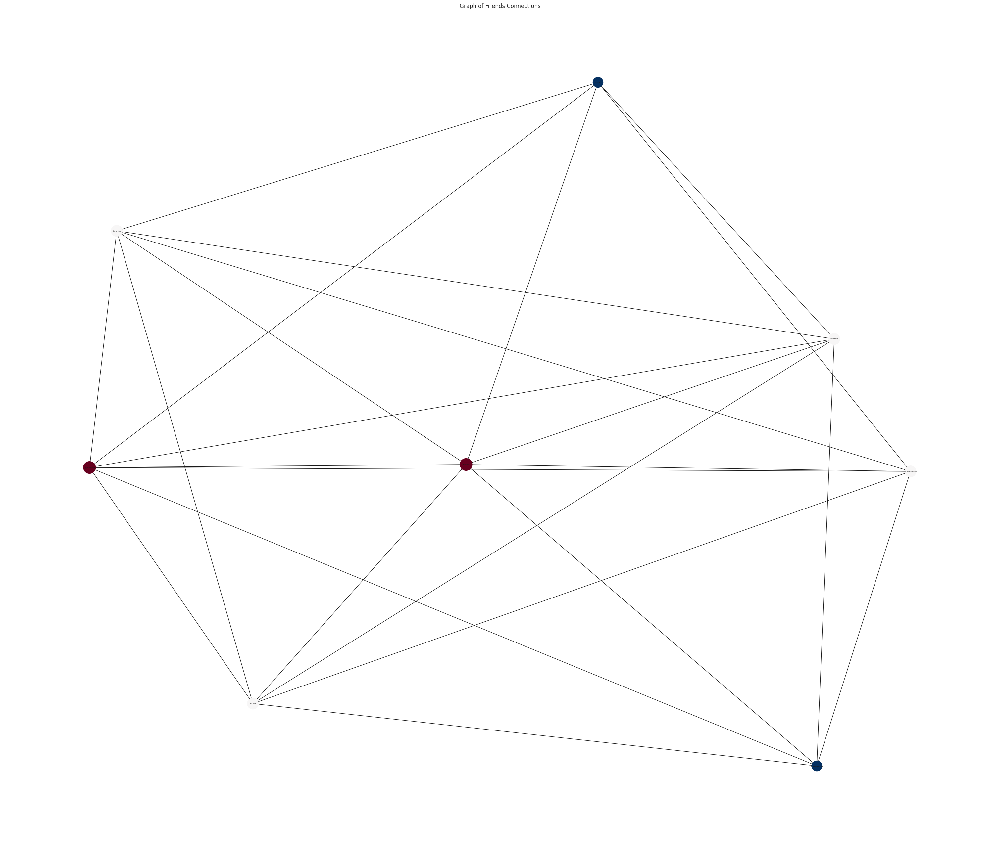

In [19]:
for c in nx.connected_components(g):
    conn_g = g.subgraph(c)
    diam = nx.diameter(conn_g)
    if diam < 2:
        continue
    show_graph(conn_g, conn_g.degree(), 100)

### 1.5. Clustering coefficient for nodes

In [20]:
clustering = nx.clustering(core_g, nodes=None, weight=None)

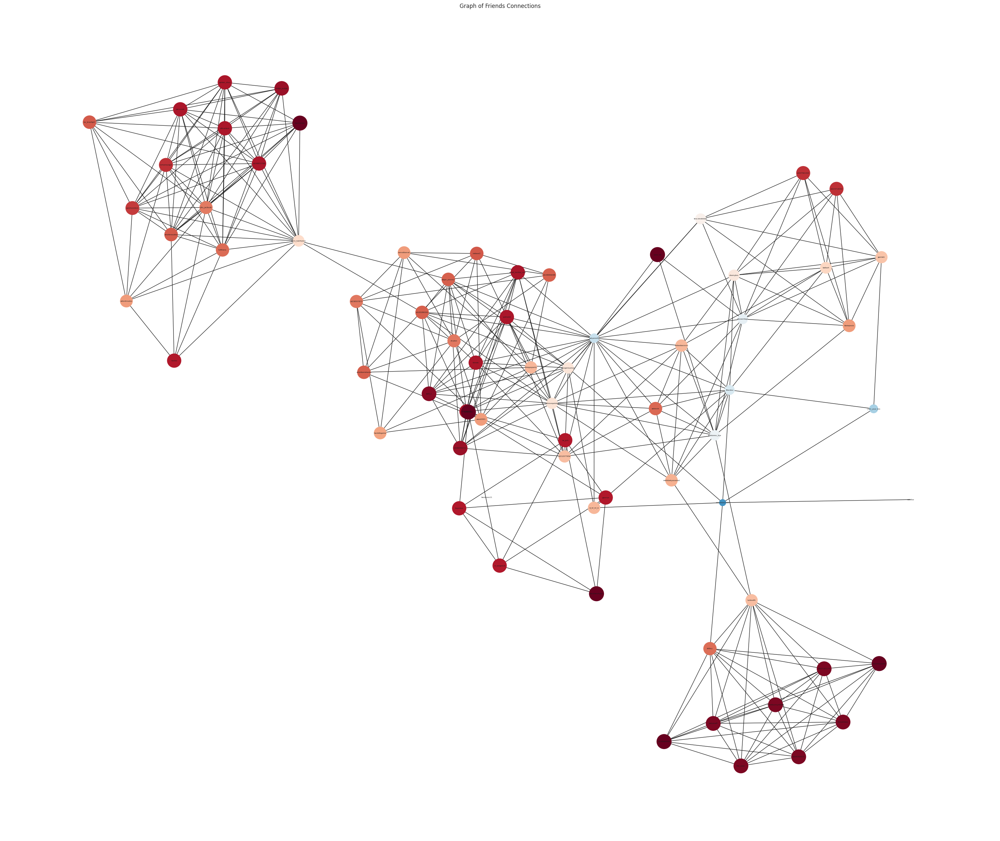

In [21]:
show_graph(core_g, clustering.items(), 1000)

In [22]:
triangles = nx.triangles(g)
print(triangles)

{4010470: 0, 189433140: 0, 7052716: 3, 124775822: 5, 131637070: 0, 151358936: 3, 157308424: 11, 284830810: 45, 11753568: 0, 56144287: 4, 48860452: 0, 102176400: 0, 186102639: 5, 207795106: 35, 227919649: 36, 269433090: 81, 323532601: 2, 64309556: 20, 121418332: 25, 181394550: 12, 224718342: 15, 333914723: 17, 385119659: 18, 407561320: 13, 81387371: 45, 148872768: 60, 152087040: 60, 156648716: 62, 176207109: 57, 190185444: 60, 225222915: 58, 226500253: 64, 297816651: 69, 302553040: 63, 323086820: 60, 81440614: 23, 148906098: 13, 149106339: 4, 154159325: 19, 162439151: 17, 169898643: 12, 175395489: 1, 226268307: 7, 238557873: 22, 320614865: 9, 329593459: 23, 445681839: 1, 81687908: 23, 118318139: 68, 173569892: 27, 231131494: 23, 431501357: 26, 557423009: 4, 85209787: 0, 153745249: 0, 95334411: 0, 124733152: 1, 112361809: 0, 133860054: 0, 166373024: 0, 112389135: 43, 151048458: 50, 160920290: 52, 165286320: 36, 186056211: 42, 192062697: 52, 210817719: 44, 257530426: 43, 212077956: 36, 11

### 1.6. Graph transitivity, the fraction of all possible triangles present in *g*

In [23]:
nx.transitivity(g)

0.6530332143837496

### 1.7. Average clustering

In [24]:
nx.average_clustering(g)

0.5853868567330106

## 2. Structural analysis

### 2.1. Compute the degree centrality for nodes.

In [25]:
degree_centrality = networkx.degree_centrality(core_g)

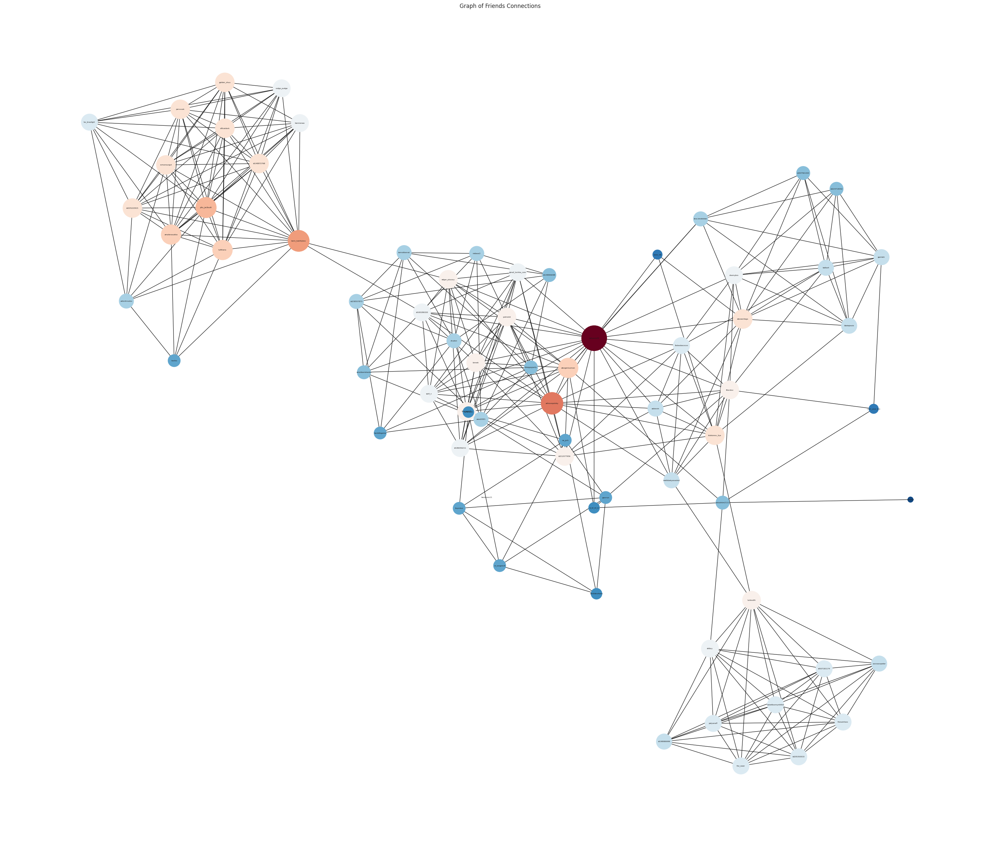

In [26]:
show_graph(core_g, degree_centrality.items(), 10000)

### 2.1. Compute closeness centrality for nodes.

In [27]:
closeness_centrality = networkx.closeness_centrality(core_g)

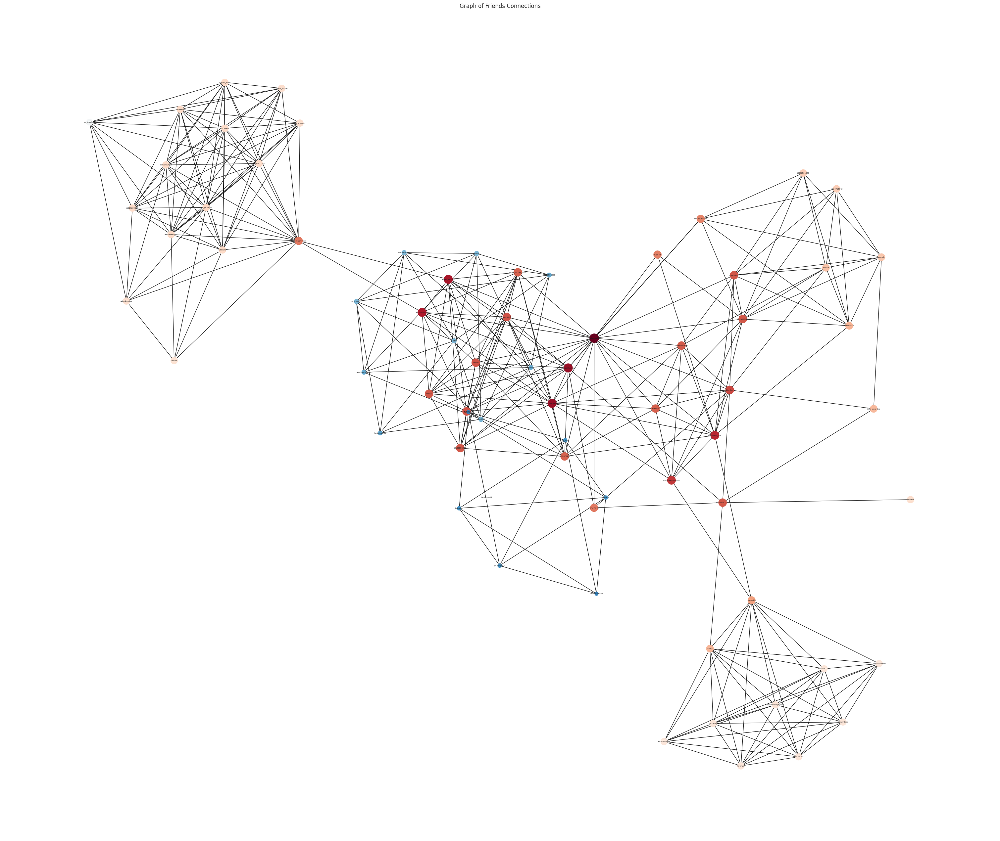

In [28]:
show_graph(core_g, closeness_centrality.items(), 1000)

### 2.1. Compute the shortest-path betweenness centrality for nodes

In [29]:
betweenness_centrality = networkx.betweenness_centrality(core_g)

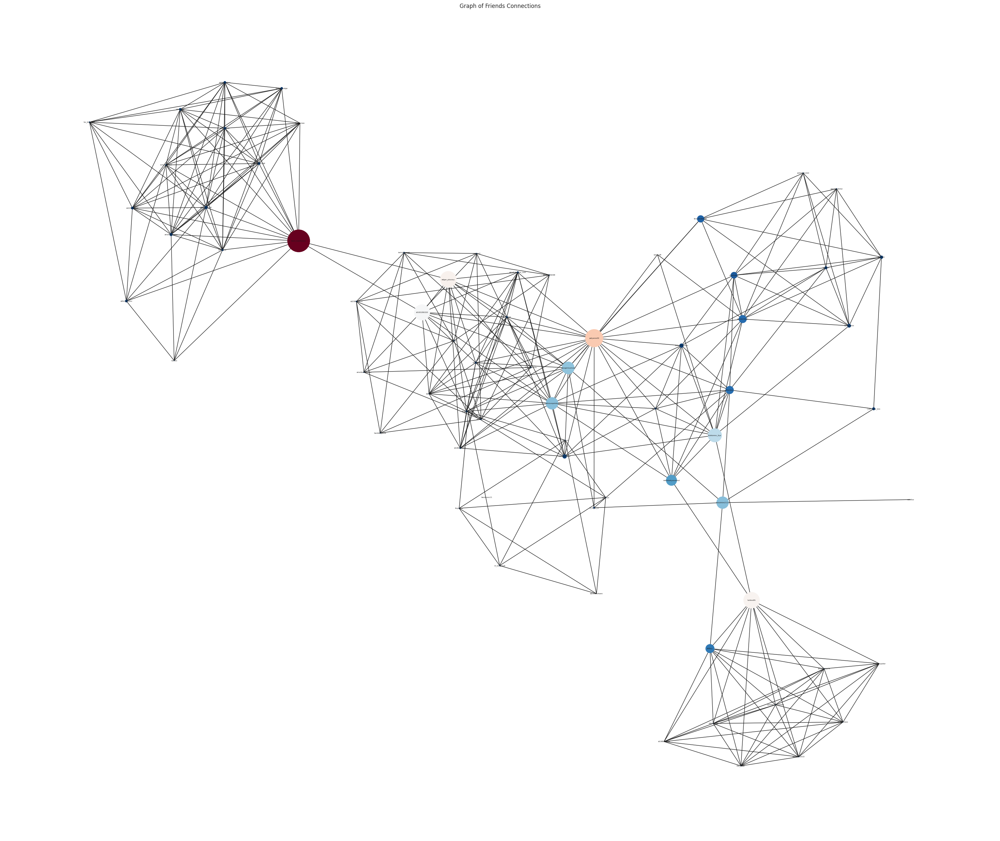

In [30]:
show_graph(core_g, betweenness_centrality.items(), 10000)

### Interpretation 

We see here huge community with small amount of main members, looks like we have introverts group

### 2.2. Page-Rank

In [31]:
pagerank = networkx.pagerank(core_g, alpha=0.85)

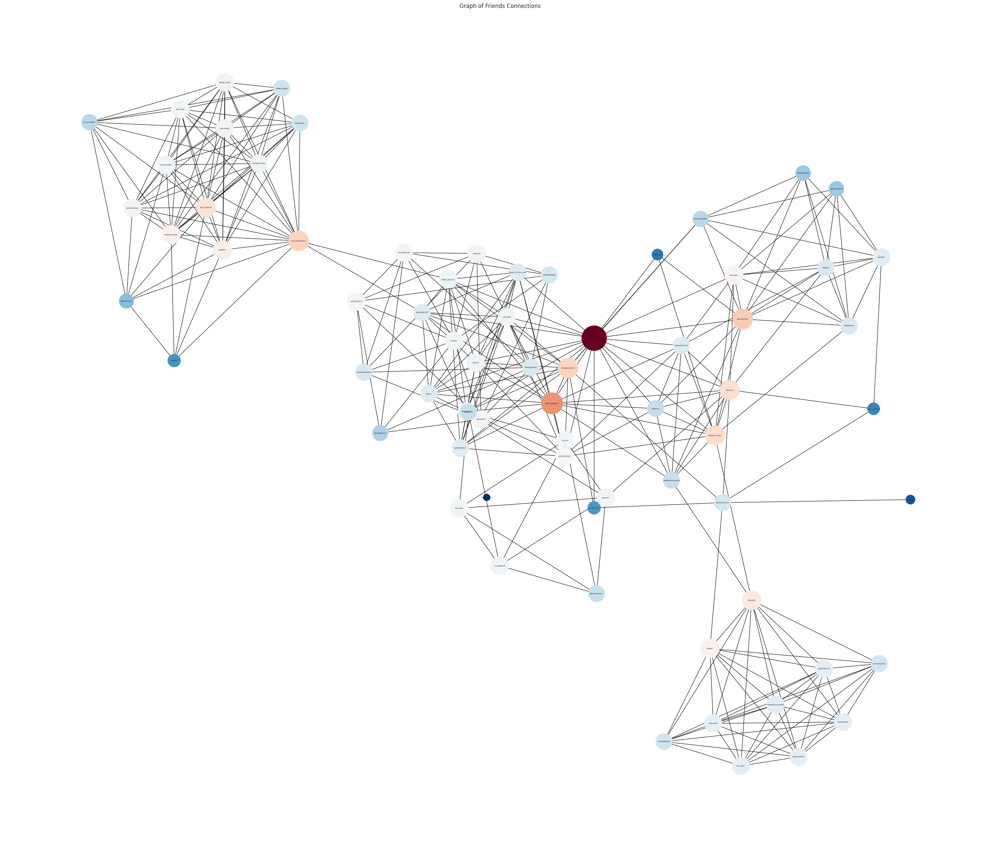

In [32]:
show_graph(core_g, pagerank.items(), 100000)

Same group of people has large page-ranks

### 2.3. Assortativity mixing

Assortativity is a preference for a network's nodes to attach to others that are similar in some way. When r = 1, the network is said to have perfect assortative mixing patterns, when r = 0 the network is non-assortative, while at r = −1 the network is completely disassortative.

In [33]:
print(g.nodes[4010470])

{'id': 4010470, 'nickname': '', 'domain': 'r_traktirov', 'bdate': '1.3', 'has_mobile': 1, 'can_post': 1, 'can_see_all_posts': 1, 'photo': 'https://sun1-14.userapi.com/s/v1/ig2/M6GOBPbszx7FxUyUbZe6Rc-1bn8P2NOjJeCPPws0-B4DuzkluSUwCW8jY3bmpdNKb31pdEKsNgxavQiHgKyUldHe.jpg?size=50x50&quality=95&crop=3,0,1917,1917&ava=1', 'can_write_private_message': 1, 'mobile_phone': '', 'home_phone': '', 'status': '', 'university': 304, 'university_name': 'НИУ МЭИ', 'faculty': 797933, 'faculty_name': 'Институт тепловой и атомной энергетики', 'graduation': 0, 'education_form': 'Очное отделение', 'relation': 4, 'universities': [{'chair': 12184, 'chair_name': 'Кафедра теоретических основ теплотехники', 'city': 1, 'country': 1, 'education_form': 'Очное отделение', 'education_form_id': 1, 'faculty': 797933, 'faculty_name': 'Институт тепловой и атомной энергетики', 'id': 304, 'name': 'НИУ МЭИ'}], 'track_code': '7c1419faQcneeDTbJmDJ8fio8f9SvJuc1ngjY1Ys95WBpFkdnZEsooAeBdZzMJv0zlEcV5jL4p_WEUYNMg', 'sex': 2, 'onlin

In [34]:
ag = nx.attribute_assortativity_coefficient(g,'sex')
ac = nx.attribute_assortativity_coefficient(g,'city_id')
au = nx.attribute_assortativity_coefficient(g,'university')
af = nx.attribute_assortativity_coefficient(g,'friends')

print('gender: ' + str(ag))
print('city: ' + str(ac))
print('university: ' + str(au))
print('friends: ' + str(af))

gender: 0.0419333993882738
city: 0.09138032000302256
university: 0.18146566161262143
friends: nan


/home/kirsr/workspace/backup/workspace/python/graphs/Social-Media-Analysis/.venv/lib/python3.10/site-packages/networkx/algorithms/assortativity/correlation.py:278: RuntimeWarning: invalid value encountered in double_scalars
  r = (t - s) / (1 - s)


Gender assortativity of our network is close to zero, which means that network is non-assortative and has no clear structure (smth between core with periphery and star).
City assortativity is also very small, the same with university and especially friends. 

### 2.4. Node structural equivalence/similarity

Similarity in network analysis occurs when two nodes fall in the same equivalence class. We will consider structural equivalence. Two nodes of a network are structurally equivalent if they share many of the same neighbors.

/home/kirsr/workspace/backup/workspace/python/graphs/Social-Media-Analysis/.venv/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/kirsr/workspace/backup/workspace/python/graphs/Social-Media-Analysis/.venv/lib/python3.10/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


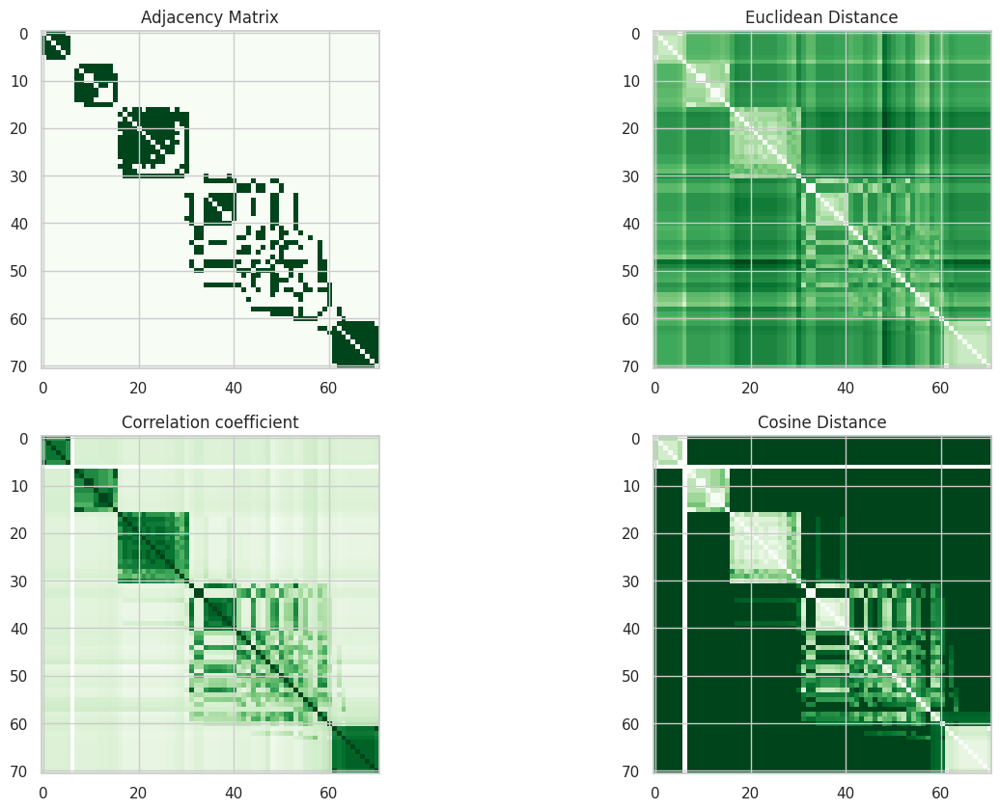

In [35]:
plot_similarity(get_sparse_matrix(core_g))

### 2.5. The closest random graph model similar to my SN

In [36]:
compare_graphs(core_g)

 
Compare the number of edges
 
My network: 310
Erdos: 330
Barabasi: 70
SW: 284
 
Compare average clustering coefficients
 
My network: 0.7603241046903016
Erdos: 0.1641730067971728
Barabasi: 0.0
SW: 0.5443773753632908
 
Compare average path length
 
My network 0: 3.05993265993266
My network 1: 1.1944444444444444
My network 2: 0
My network 3: 1.0666666666666667
Erdos: 2.129577464788732
Barabasi: 4.6800804828973845
SW: 2.875251509054326
 
Compare graph diameter
 
My network 0: 7
My network 1: 2
My network 2: 0
My network 3: 2
Erdos: 4
Barabasi: 10
SW: 5


#### looks like the closest graph is SW

## 3. Community Detection

### 3.1. Clique Search

In [37]:
cliques = list(nx.find_cliques(core_g))

In [38]:
cliques

[[152087040,
  148872768,
  190185444,
  323086820,
  297816651,
  302553040,
  184626482,
  333186408],
 [152087040,
  148872768,
  190185444,
  323086820,
  297816651,
  302553040,
  184626482,
  156648716,
  176207109,
  226500253],
 [152087040,
  148872768,
  190185444,
  323086820,
  297816651,
  302553040,
  225222915,
  333186408],
 [152087040,
  148872768,
  190185444,
  323086820,
  297816651,
  302553040,
  225222915,
  176207109,
  81387371,
  156648716,
  226500253],
 [269433090, 557423009, 284830810],
 [269433090, 557423009, 81687908],
 [269433090, 207795106, 227919649, 121418332],
 [269433090, 207795106, 227919649, 431501357, 231131494],
 [269433090, 207795106, 227919649, 56144287],
 [269433090, 207795106, 181394550],
 [269433090, 181394550, 284830810],
 [269433090, 118318139, 227919649, 173569892, 431501357, 81687908, 231131494],
 [269433090, 118318139, 227919649, 173569892, 431501357, 212077956],
 [269433090,
  118318139,
  160920290,
  192062697,
  151048458,
  2120779

### 3.2. Spectral clustering

My network i=0/25 with n=2:
My network i=1/25 with n=93:
         x1        x2        x3  label
0 -0.057444 -0.009103  0.048902    1.0
1 -0.064742 -0.011558  0.051399    1.0
2 -0.025913 -0.004173  0.022734    1.0
3 -0.064808 -0.011259  0.055703    1.0
4 -0.094137 -0.021512  0.033446    1.0


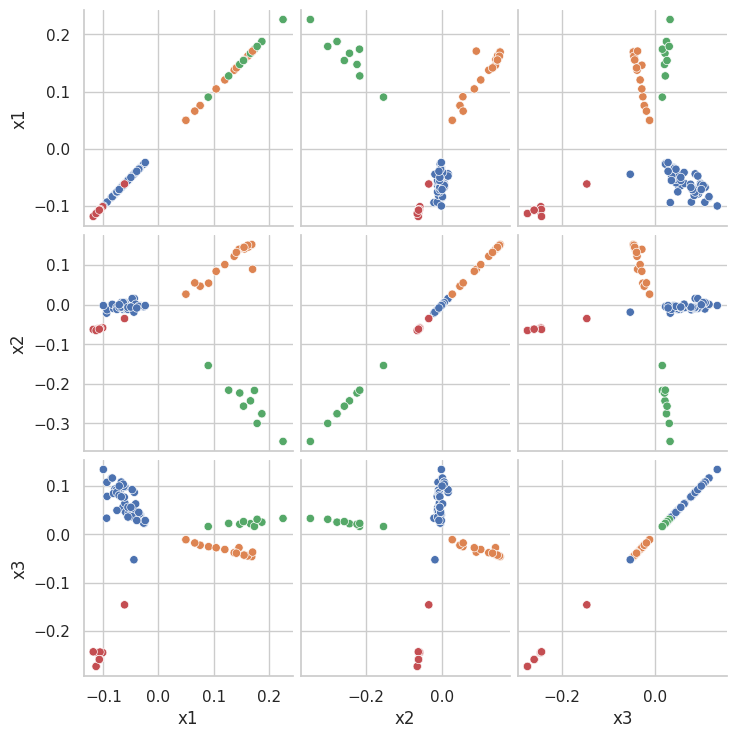

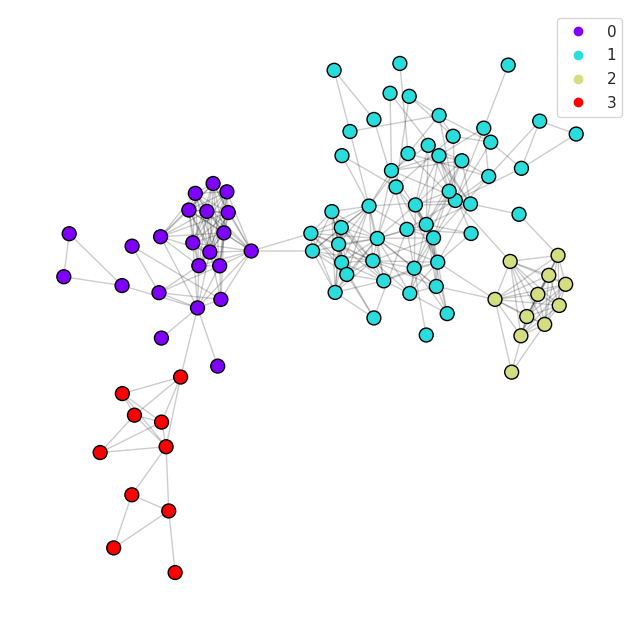

My network i=2/25 with n=1:
My network i=3/25 with n=1:
My network i=4/25 with n=1:
My network i=5/25 with n=2:
My network i=6/25 with n=15:
         x1        x2        x3  label
0  0.369041  0.172902  0.541257    1.0
1  0.023023 -0.246960 -0.079499    0.0
2 -0.391254 -0.354937  0.310525    2.0
3  0.375920 -0.084192  0.022610    0.0
4 -0.299641  0.456405 -0.131720    3.0


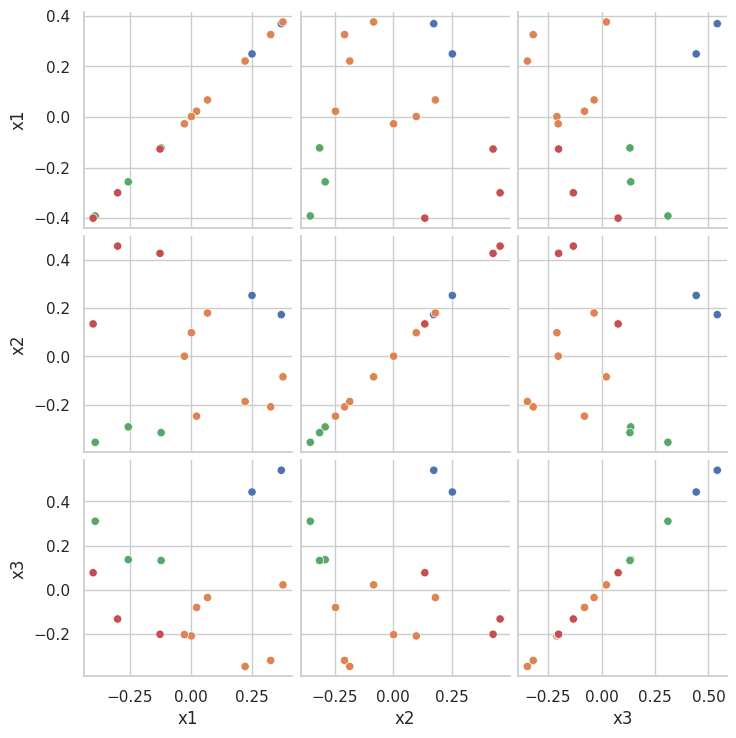

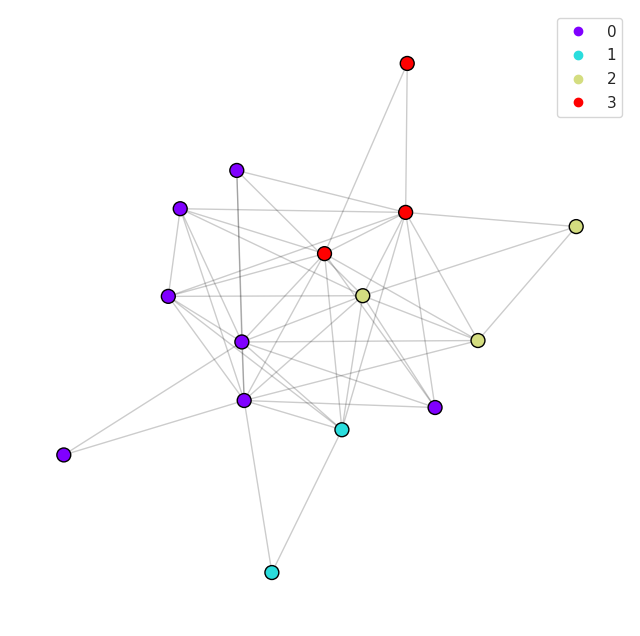

My network i=7/25 with n=3:
My network i=8/25 with n=1:
My network i=9/25 with n=8:
My network i=10/25 with n=1:
My network i=11/25 with n=1:
My network i=12/25 with n=3:
My network i=13/25 with n=1:
My network i=14/25 with n=1:
My network i=15/25 with n=1:
My network i=16/25 with n=1:
My network i=17/25 with n=2:
My network i=18/25 with n=2:
My network i=19/25 with n=1:
My network i=20/25 with n=1:
My network i=21/25 with n=1:
My network i=22/25 with n=1:
My network i=23/25 with n=1:
My network i=24/25 with n=1:


In [39]:
from functions_for_analisys import spectral_clustering, spectral_embedding
import pandas as pd

g = nx.read_gpickle('myGraph.gpickle')
components = list(nx.connected_components(g))
l = len(components)
for i, c in enumerate(components):
    conn_g = g.subgraph(c)
    n = nx.number_of_nodes(conn_g)
    print(f'My network i={i}/{l} with n={n}:')
    if n < 10:
        continue
    lesG = nx.convert_node_labels_to_integers(conn_g)
    lespos = nx.kamada_kawai_layout(lesG)
    n_components = 3
    try:
        labels, embedding = spectral_clustering(lesG, n_components+1, n_components)
    except:
        print("An exception occurred")
        continue
    res = np.hstack([embedding, labels[:, None]])
    columns = [f'x{i}' for i in range(1, n_components+1)]
    columns += ['label']
    pair_data = pd.DataFrame(
        res,
        columns=columns)
    print(pair_data.head())
    pair_data.label = pair_data.label.astype('str')
    p = sns.pairplot(
        pair_data,
        hue='label',
        diag_kind=None
    )
    p._legend.remove()
    plt.show()

    plt.figure(figsize=(8, 8))
    nodes = nx.draw_networkx_nodes(
        lesG,
        lespos,
        cmap=plt.cm.rainbow,
        node_color=labels,
        node_size=100,
        linewidths=1,
        edgecolors='black'
    )
    nx.draw_networkx_edges(
        lesG,
        lespos,
        alpha=0.2,
        edge_color='black'
    )
    plt.axis('off')
    plt.legend(*nodes.legend_elements())
    plt.show()
    

### 3.3. K-core decomposition

In [40]:
def k_core_decompose(G):
    ### BEGIN SOLUTION
    return np.array(list(nx.core_number(G).values()))
    ### END SOLUTION

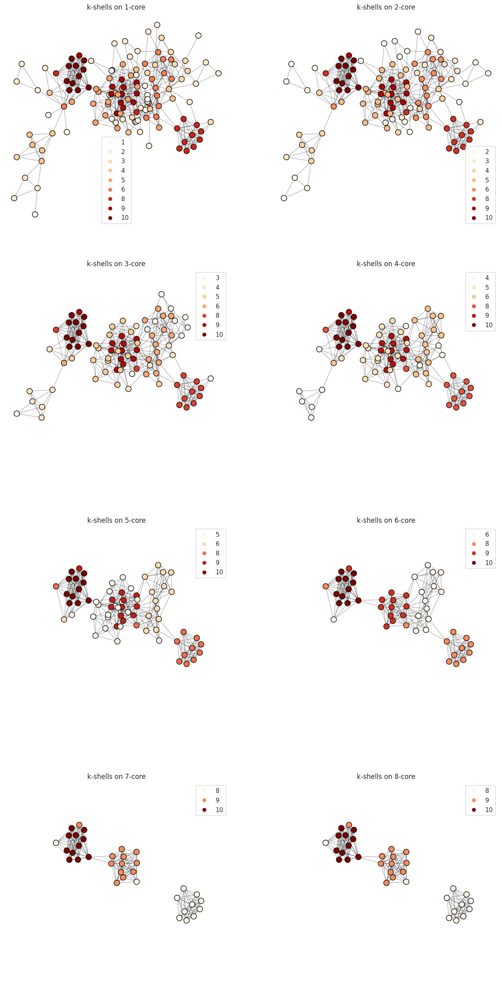

In [41]:


lesG = nx.convert_node_labels_to_integers(g)
lespos = nx.kamada_kawai_layout(lesG)

plt.figure(figsize=(8*2, 8*4))
x_max, y_max = np.array(list(lespos.values())).max(axis=0)
x_min, y_min = np.array(list(lespos.values())).min(axis=0)

for i in range(8):
    plt.subplot(4, 2, i+1)
    subG = nx.k_core(lesG, i+1)
    nodes = nx.draw_networkx_nodes(
        subG,
        lespos,
        cmap=plt.cm.OrRd,
        node_color=k_core_decompose(subG),
        node_size=100,
        edgecolors='black'
    )
    nx.draw_networkx_edges(
        subG,
        lespos,
        alpha=0.3,
        width=1,
        edge_color='black'
    )
    eps = (x_max - x_min) * 0.05
    plt.xlim(x_min-eps, x_max+eps)
    plt.ylim(y_min-eps, y_max+eps)
    plt.legend(*nodes.legend_elements())
    plt.axis('off')
    plt.title('k-shells on {}-core'.format(i+1))

### 3.4. Clique detection

In [42]:
def largest_cliques(G):
    cliques = list(nx.find_cliques(G)) # Находим все клики в графе

    largest_cliques = [clique for clique in cliques if len(clique) == max(map(len, cliques))] # Находим все клики максимального размера

    n = len(largest_cliques)
    m = len(G.nodes)
    k = len(G.edges)

    colors = np.ones((n, m, 3)) # Создаем массив цветов
    widths = np.ones((n, k)) * 0.4 # Создаем массив ширин

    for j, lc in enumerate(largest_cliques):
        for i, node in enumerate(G.nodes):
            colors[j, i, :] = np.zeros(3) if node in lc else np.ones(3)

        for i, edge in enumerate(G.edges):
            widths[j, i] = 2 if edge[0] in lc and edge[1] in lc else 0.4

    return colors, widths

(array([[0., 0., 0.],
       [1., 1., 1.]]), array([ 11, 135]))


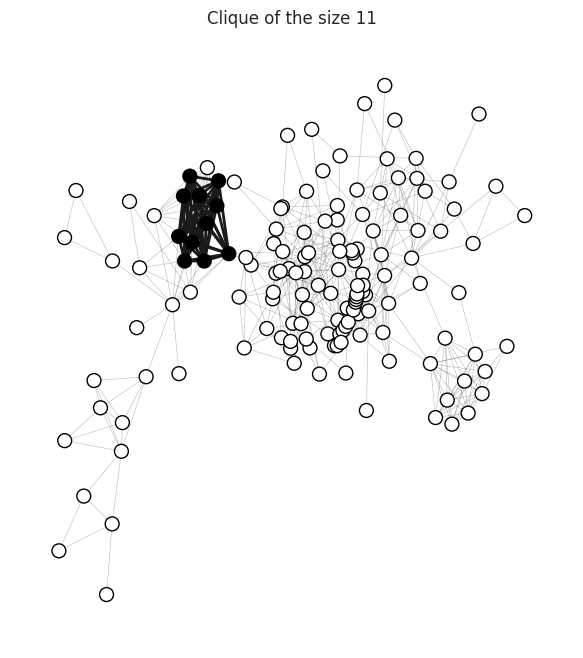

In [43]:
colors, widths = largest_cliques(lesG)
print(np.unique(colors[0], axis=0, return_counts=True))
size = np.unique(colors[0], axis=0, return_counts=True)[1][0]

plt.figure(figsize=(8*2, 8))

for i in range(colors.shape[0]):

    b_edges = np.array(list(lesG.edges))[widths[i] == widths[i].max()]

    plt.subplot(1, 2, i+1)
    nodes = nx.draw_networkx_nodes(
        lesG,
        lespos,
        node_color=colors[i],
        node_size=100,
        linewidths=1,
        edgecolors='black'
    )
    nx.draw_networkx_edges(
        lesG,
        lespos,
        alpha=0.3,
        width=widths[i].min()
    )
    nx.draw_networkx_edges(
        lesG,
        lespos,
        width=widths[i].max(),
        edgelist=b_edges
    )
    plt.title('Clique of the size {}'.format(size))
    plt.axis('off')

### 3.5. Agglomerative clustering

In [44]:
def simrank_distance(G):
    """
    Compute a distance matrix based on SimRank similarity for a given graph.

    Parameters:
        G (nx.Graph): The input graph.

    Returns:
        np.array: Distance matrix based on SimRank.
    """
    num_nodes = len(G)
    distance_matrix = np.zeros((num_nodes, num_nodes))

    for i in range(num_nodes):
        for j in range(i, num_nodes):
            simrank_similarity = nx.simrank_similarity(G, source=i, target=j)
            distance_matrix[i, j] = 1.0 - simrank_similarity
            distance_matrix[j, i] = 1.0 - simrank_similarity  # Make the matrix absolutely symmetric

    return distance_matrix

In [45]:
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import dendrogram, linkage

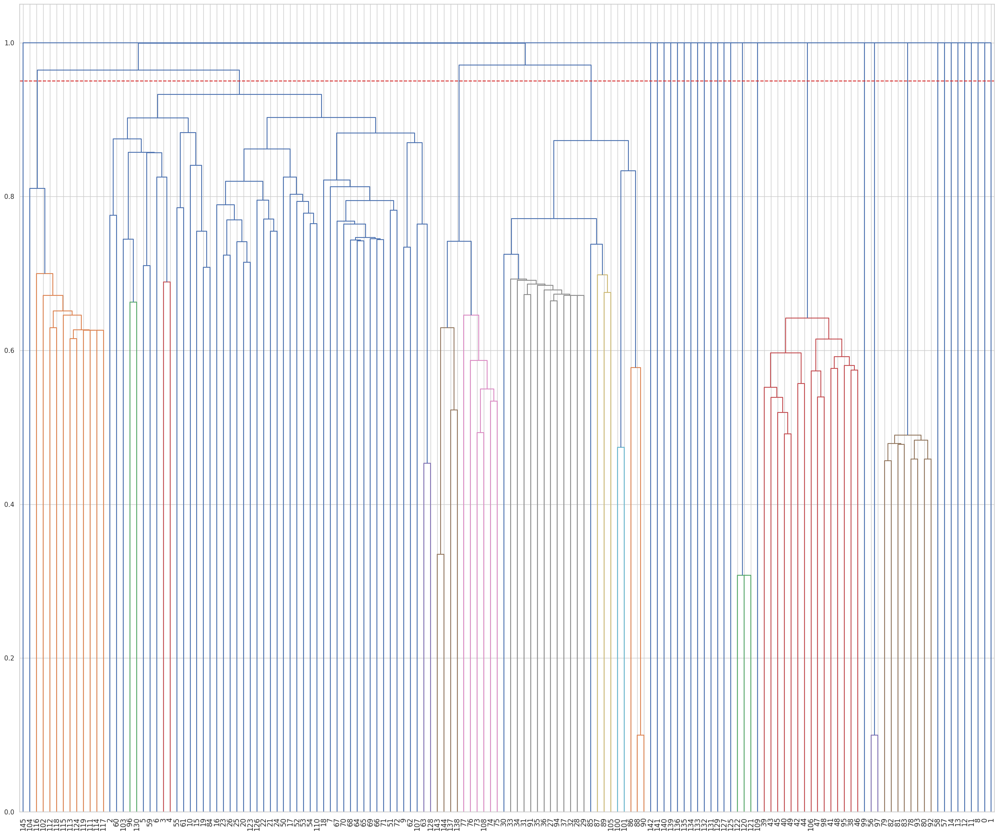

In [46]:
distance = simrank_distance(lesG)

plt.figure(figsize=(30, 25))
linked = linkage(squareform(distance), 'complete')
dendrogram(linked, labels=list(lesG.nodes),
           leaf_font_size=12)
plt.plot([0, 2000], [0.95, 0.95], linestyle='--', c='tab:red')
plt.show()

In [47]:
ldf = pd.DataFrame(linked, columns=['combined_clusters_1', 'combined_clusters_2', 'distance', 'observations'])
ldf.loc[ldf.distance >= 0.95]

,combined_clusters_1,combined_clusters_2,distance,observations
113,240.0,258.0,0.964088,61.0
114,215.0,252.0,0.970866,32.0
115,259.0,260.0,0.999308,93.0
116,0.0,1.0,1.000000,2.0
117,8.0,262.0,1.000000,3.0
118,11.0,263.0,1.000000,4.0
119,12.0,264.0,1.000000,5.0
120,13.0,265.0,1.000000,6.0
121,14.0,266.0,1.000000,7.0
122,57.0,267.0,1.000000,8.0


<Axes: >

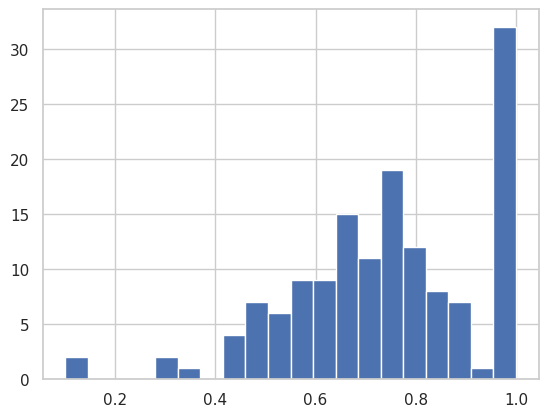

In [48]:
ldf.distance.hist(bins=20)

In [49]:
from sklearn.cluster import AgglomerativeClustering

In [50]:
def agglomerative_clustering(distance, max_distance):
    clustering = AgglomerativeClustering(n_clusters=None, distance_threshold=max_distance,
                                         linkage='complete', affinity='precomputed',)
    clustering.fit(distance)
    return clustering.labels_

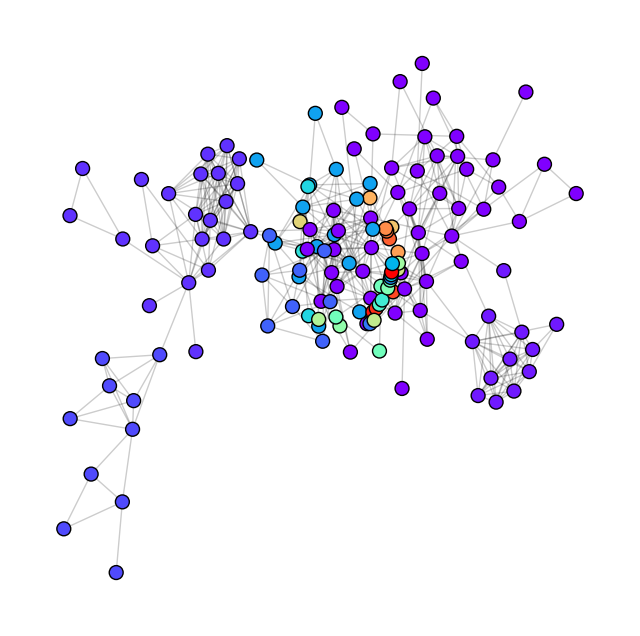

In [51]:
labels = agglomerative_clustering(distance, 0.95)
plt.figure(figsize=(8, 8))
nx.draw_networkx_nodes(
    lesG,
    lespos,
    cmap=plt.cm.rainbow,
    node_color=labels,
    node_size=100,
    linewidths=1,
    edgecolors='black'
)
nx.draw_networkx_edges(
    lesG,
    lespos,
    alpha=0.2,
    edge_color='black'
)
plt.axis('off')
plt.show()

### 3.6. Girvan-Newman algorithm

In [52]:
def remove_bridges(G):
    # YOUR CODE HERE
    num_components = len(list(nx.connected_components(G)))
    while len(list(nx.connected_components(G))) != num_components + 1:
        edge_betweenness = nx.edge_betweenness_centrality(G)
        max_betweenness = max(edge_betweenness.values())
        
        bridges = [edge for edge, centrality in edge_betweenness.items() if centrality == max_betweenness]
        G.remove_edges_from(bridges)
    return G


def girvan_newman(G, n):
    labels = np.zeros((n, len(G)))
    _G = G.copy()
    for division in range(n):
        remove_bridges(_G)
        for i, cc in enumerate(nx.connected_components(_G)):
            labels[division, list(cc)] = i
    return labels

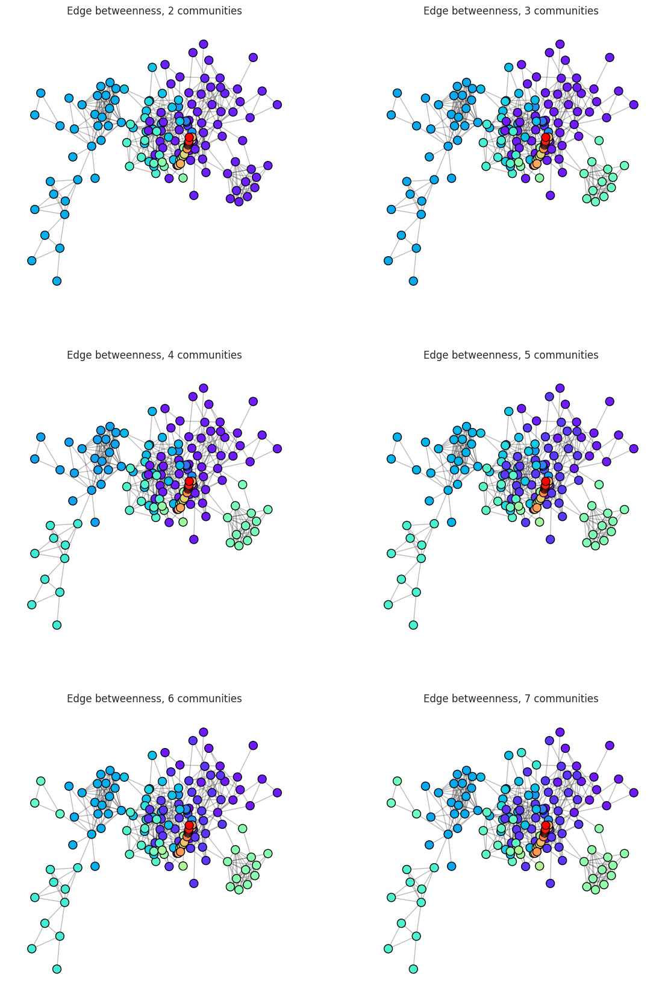

In [53]:
labels = girvan_newman(lesG, 6)

plt.figure(figsize=(7*2, 7*3))
for i in range(labels.shape[0]):
    plt.subplot(3, 2, i+1)
    nx.draw_networkx_nodes(
        lesG,
        lespos,
        cmap=plt.cm.rainbow,
        node_color=labels[i],
        node_size=100,
        edgecolors='black'
    )
    nx.draw_networkx_edges(lesG, lespos, alpha=0.3)
    plt.title('Edge betweenness, {} communities'.format(i+2))
    plt.axis('off')

### 3.7. Modularity

In [54]:
def kronecker(A, communities):
    # YOUR CODE HERE
    n = A.shape[0]
    delta = np.zeros((n, n))
    for community in communities:
        for i in community:
            for j in community:
                # print(type(i), i, type(j), j)
                delta[i, j] = 1

    return delta

In [55]:
def expected_edges(A, m):
    # YOUR CODE HERE
    n = A.shape[0]  # Number of nodes
    # Calculate the degree of each node
    k = np.sum(A, axis=1)

    # Compute the expected edges for each pair of nodes
    expected = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            expected[i, j] = k[i] * k[j] / (2 * m)

    return expected

In [56]:
def modularity(A, communities):
    m = A.sum() / 2
    res = (A - expected_edges(A, m)) * kronecker(A, communities)
    return res.sum() / 2 / m

In [57]:
def edge_betw_modularity(G, n):
    # YOUR CODE HERE
    # Compute adjacency matrix
    A = nx.to_numpy_array(G)

    # Initialize modularity scores array
    _G = G.copy()
    modularity_scores = []

    for division in range(n):
        remove_bridges(_G)
        A = nx.to_numpy_array(_G)
        communities = nx.connected_components(_G)
        modularity_scores.append(modularity(A, communities))
    return np.array(modularity_scores)

In [58]:
n_iterations = 20
mod_val = edge_betw_modularity(lesG, n_iterations)

ValueError: max() arg is an empty sequence